In [52]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Preprocesamiento de los datos

## Exploración inicial espontáneo

In [53]:
# Leemos el dataset
file_path = "../data/spontaneous_30s_movie_one_resultados/spikes_0.csv"
df = pd.read_csv(file_path, delimiter=";")
df.head()

,attack,n_exec,stimulus,BKG,timestamps,neuron_ids,cortical_layer,population,behaviour
0,Spontaneous,0,Movie_h5,BKG_1000Hz,471.00,45,VisL5,LIFe5Rbp4,e
1,Spontaneous,0,Movie_h5,BKG_1000Hz,1532.75,45,VisL5,LIFe5Rbp4,e
2,Spontaneous,0,Movie_h5,BKG_1000Hz,2193.25,45,VisL5,LIFe5Rbp4,e
3,Spontaneous,0,Movie_h5,BKG_1000Hz,4019.50,45,VisL5,LIFe5Rbp4,e
4,Spontaneous,0,Movie_h5,BKG_1000Hz,4980.00,45,VisL5,LIFe5Rbp4,e


In [3]:
# Ver cuántos valores nulos hay por columna
print(df.isnull().sum())

attack            0
n_exec            0
stimulus          0
BKG               0
timestamps        0
neuron_ids        0
cortical_layer    0
population        0
behaviour         0
dtype: int64


In [4]:
# Filas duplicadas
print(df.duplicated().sum())

0


In [5]:
# Ver nombres de columnas y tipos de datos
print(df.info())

# Estadísticas descriptivas de columnas numéricas
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3676314 entries, 0 to 3676313
Data columns (total 9 columns):
 #   Column          Dtype  
---  ------          -----  
 0   attack          object 
 1   n_exec          int64  
 2   stimulus        object 
 3   BKG             object 
 4   timestamps      float64
 5   neuron_ids      int64  
 6   cortical_layer  object 
 7   population      object 
 8   behaviour       object 
dtypes: float64(1), int64(2), object(6)
memory usage: 252.4+ MB
None
          n_exec    timestamps    neuron_ids
count  3676314.0  3.676314e+06  3.676314e+06
mean         0.0  1.503011e+04  1.122196e+05
std          0.0  8.499810e+03  6.966241e+04
min          0.0  1.200000e+01  0.000000e+00
25%          0.0  7.666000e+03  4.641800e+04
50%          0.0  1.533188e+04  1.144350e+05
75%          0.0  2.220650e+04  1.673320e+05
max          0.0  3.000000e+04  2.309210e+05


In [6]:
# Estadísiticas columnas categóricas
columnas_categoricas = df.select_dtypes(include=['object']).columns
for columna in columnas_categoricas:
    print(f"\n🔸 Columna categórica: '{columna}'")
    print(df[columna].value_counts(dropna=False))


🔸 Columna categórica: 'attack'
attack
Spontaneous    3676314
Name: count, dtype: int64

🔸 Columna categórica: 'stimulus'
stimulus
Movie_h5    3676314
Name: count, dtype: int64

🔸 Columna categórica: 'BKG'
BKG
BKG_1000Hz    3676314
Name: count, dtype: int64

🔸 Columna categórica: 'cortical_layer'
cortical_layer
VisL5     1037584
VisL23     989631
VisL6      841597
VisL4      596313
VisL1      211189
Name: count, dtype: int64

🔸 Columna categórica: 'population'
population
LIFe6Ntsr1     625792
LIFe23Cux2     563913
LIFe5Rbp4      514586
LIFe5noRbp4    222039
e6Ntsr1        189634
LIFi1Htr3a     164771
e23Cux2        158412
e5Rbp4         154762
LIFe4Scnn1a    130907
LIFi23Htr3a    120986
LIFi4Pvalb     102181
LIFe4other     100854
LIFe4Rorb       92760
e5noRbp4        70742
LIFi5Pvalb      56943
LIFi23Pvalb     47611
i1Htr3a         46418
i23Htr3a        37048
LIFe4Nr5a1      36686
e4Scnn1a        35909
LIFi23Sst       34924
e4other         29556
i4Pvalb         27995
e4Rorb          24

### Conclusiones espontáneo

Dataset de 3676314 filas x 9 columnas. 
No hay valores faltantes ni filas repetidas.
Hay 3 predictores numéricos:

* n_exex == 0
* timestamps: momento en el que la neurona hace spike. Rango [12 ms, 30000 ms]
* neuron_ids: id de la neurona que hace spike. Rango [0, 230921]

Hay 6 variables categóricas:

* attack: que en este caso es siempre $Spontaneous$
* stimulus: estímulo concreto, que en este caso es $Movie\_h5$
* BKG: constante con valor $BKG\_1000Hz$
* cortical_layer: capa concreta de la corteza neuronal. 5 valores: [VisL5, VisL23, VisL6, VisL4, VisL1]
* population: población concreta. 42 valores (ver arriba)
* behaviour: si es inhibidora (i) o excitadora (e)

## Exploración inicial ataque FLO 25%

In [54]:
file_path_FLO = "../data/FLO_4instants_25neurons_30s_movie_one_resultados/spikes_0.csv"
df_FLO = pd.read_csv(file_path_FLO, delimiter=";")
df_FLO.head()

,attack,n_exec,stimulus,BKG,instant_attack,v_increment,n_neurons,timestamps,neuron_ids,cortical_layer,population,behaviour
0,FLO,0,Movie_h5,BKG_1000Hz,"1,7500,15000,22500",551,57731,471.0,45,VisL5,LIFe5Rbp4,e
1,FLO,0,Movie_h5,BKG_1000Hz,"1,7500,15000,22500",551,57731,827.5,45,VisL5,LIFe5Rbp4,e
2,FLO,0,Movie_h5,BKG_1000Hz,"1,7500,15000,22500",551,57731,1532.0,45,VisL5,LIFe5Rbp4,e
3,FLO,0,Movie_h5,BKG_1000Hz,"1,7500,15000,22500",551,57731,2193.5,45,VisL5,LIFe5Rbp4,e
4,FLO,0,Movie_h5,BKG_1000Hz,"1,7500,15000,22500",551,57731,4019.5,45,VisL5,LIFe5Rbp4,e


In [9]:
# Ver cuántos valores nulos hay por columna
print(df_FLO.isnull().sum())

# Filas duplicadas
print(df_FLO.duplicated().sum())

# Ver nombres de columnas y tipos de datos
print(df_FLO.info())

# Estadísticas descriptivas de columnas numéricas
print(df_FLO.describe())

attack            0
n_exec            0
stimulus          0
BKG               0
instant_attack    0
v_increment       0
n_neurons         0
timestamps        0
neuron_ids        0
cortical_layer    0
population        0
behaviour         0
dtype: int64
0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3710535 entries, 0 to 3710534
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   attack          object 
 1   n_exec          int64  
 2   stimulus        object 
 3   BKG             object 
 4   instant_attack  object 
 5   v_increment     int64  
 6   n_neurons       int64  
 7   timestamps      float64
 8   neuron_ids      int64  
 9   cortical_layer  object 
 10  population      object 
 11  behaviour       object 
dtypes: float64(1), int64(4), object(7)
memory usage: 339.7+ MB
None
          n_exec  v_increment  n_neurons    timestamps    neuron_ids
count  3710535.0    3710535.0  3710535.0  3.710535e+06  3.710535e+06
mean         0.0   

### Conclusiones ataque

3677387 filas x 12 columnas.

Mismas variables + 3 correspondientes a los atributos de ataque:

* v_increment: voltaje con el que se estimula a las neuronas. Constante 551.
* n_neurons: número de neuronas afectadas. Constante 57731 (25% de 230921)
* instant_attack: instantes de ataque. En total son 4: 1, 7500, 15000, 22500 ms.

En esta ocasión, el rango del timestamp es [7.5, 30000] ms.

En el caso del dataset 0, hay 3710535 - 3676314 = 34221 instancias nuevas, por lo que se producen 34221 activaciones respecto a la actividad espontánea.

## Series temporales: espontáneo vs ataque

In [55]:
## Función para convertir el df a serie temporal
def add_interval_column(df, long_interval):
    # Definimos los límites de los intervalos
    bins = range(0, 30000 + long_interval, long_interval)  # 0 a 30000 ms en intervalos de long_interval ms
    # Agregamos una nueva columna al DataFrame con las etiquetas de los intervalos
    df.loc[:, 'interval'] = pd.cut(df['timestamps'], bins=bins, labels=False) + 1
    return df

In [56]:
## Variable que determina la longitud del intervalo
TW = 100

In [57]:
# Espontánea
df = add_interval_column(df, TW) 
time_series_spont = df.groupby(['interval']).size().reset_index(name='spikes')
time_series_spont 

,interval,spikes
0,1,4018
1,2,9016
2,3,9135
3,4,8741
4,5,11205
...,...,...
295,296,12324
296,297,8616
297,298,8424
298,299,9601


In [58]:
# Ataque
df_FLO = add_interval_column(df_FLO, TW) 
time_series_FLO = df_FLO.groupby(['interval']).size().reset_index(name='spikes')
time_series_FLO

,interval,spikes
0,1,5279
1,2,9253
2,3,9030
3,4,8600
4,5,11198
...,...,...
295,296,12334
296,297,8650
297,298,8446
298,299,9601


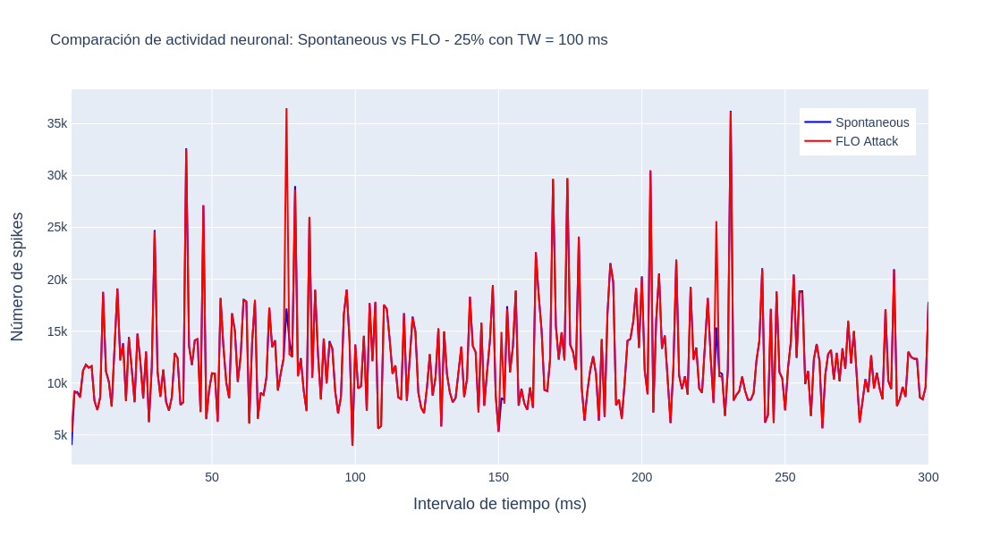

In [51]:
# Crear figura
fig = go.Figure()

# Añadir serie 'time_series' (azul)
fig.add_trace(go.Scatter(
    x=time_series_spont['interval'],
    y=time_series_spont['spikes'],
    mode='lines',
    name='Spontaneous',
    line=dict(color='blue')
))

# Añadir serie 'time_series_FLO' (rojo)
fig.add_trace(go.Scatter(
    x=time_series_FLO['interval'],
    y=time_series_FLO['spikes'],
    mode='lines',
    name='FLO Attack',
    line=dict(color='red')
))

# Actualizar diseño
fig.update_layout(
    width=1100,
    height=600,
    title=f'Comparación de actividad neuronal: Spontaneous vs FLO - 25% con TW = {TW} ms',
    xaxis=dict(
        title='Intervalo de tiempo (ms)',
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),
    yaxis=dict(
        title='Número de spikes',
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),
    legend=dict(
        x=0.85,
        y=0.95,
        font=dict(size=14)
    )
)

# Mostrar gráfico
fig.show()

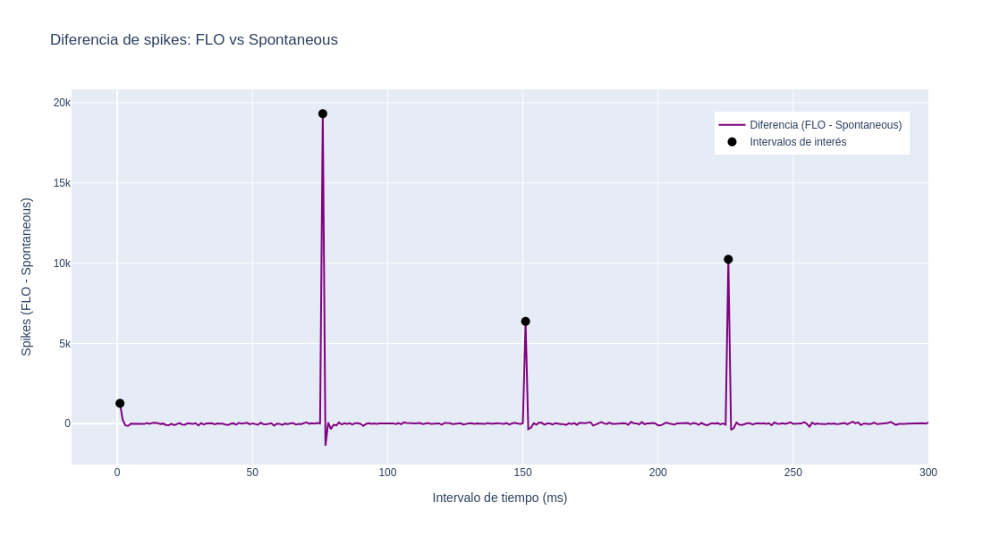

In [59]:
# Calcular la diferencia de spikes entre FLO y espontáneo
diferencia_spikes = time_series_FLO['spikes'] - time_series_spont['spikes']

# Crear gráfico de líneas para la diferencia
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=time_series_FLO['interval'],
    y=diferencia_spikes,
    mode='lines',
    name='Diferencia (FLO - Spontaneous)',
    line=dict(color='purple')
))


# Intervalos donde quieres poner los puntos
intervalos_a_marcar = [1//TW + 1, 7500//TW + 1, 15000//TW + 1, 22500//TW + 1]

# Extraer valores de diferencia_spikes en esos intervalos
valores_marcados = []
for intervalo in intervalos_a_marcar:
    valor = diferencia_spikes[time_series_FLO['interval'] == intervalo].values
    if len(valor) > 0:
        valores_marcados.append(valor[0])
    else:
        valores_marcados.append(None)  # Si no existe el intervalo

# Añadir puntos negros
fig.add_trace(go.Scatter(
    x=intervalos_a_marcar,
    y=valores_marcados,
    mode='markers',
    name='Intervalos de interés',
    marker=dict(color='black', size=10, symbol='circle')
))

# Actualizar diseño del gráfico
fig.update_layout(
    width=1100,
    height=600,
    title='Diferencia de spikes: FLO vs Spontaneous',
    xaxis_title='Intervalo de tiempo (ms)',
    yaxis_title='Spikes (FLO - Spontaneous)',
    legend=dict(x=0.75, y=0.94)
)

# Mostrar gráfico
fig.show()

## Serie temporal en los intervalos de ataque (puntos 1, 7500, 15000, 22500)

In [60]:
TW = 1
df = add_interval_column(df, TW) 
time_series_spont = df.groupby(['interval']).size().reset_index(name='spikes')
df_FLO = add_interval_column(df_FLO, TW) 
time_series_FLO = df_FLO.groupby(['interval']).size().reset_index(name='spikes')

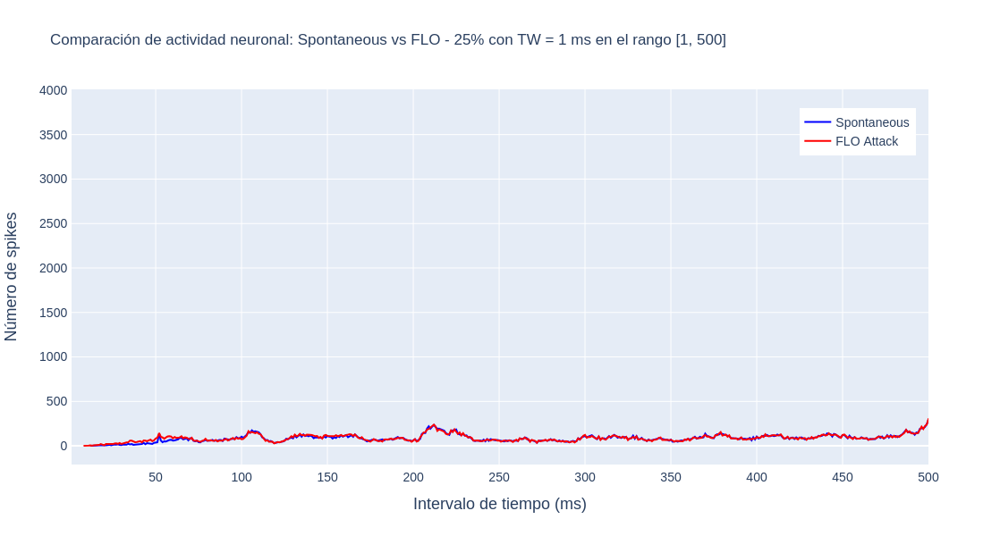

In [61]:
# Crear figura
fig = go.Figure()

# Añadir serie 'time_series' (azul)
fig.add_trace(go.Scatter(
    x=time_series_spont['interval'],
    y=time_series_spont['spikes'],
    mode='lines',
    name='Spontaneous',
    line=dict(color='blue')
))

# Añadir serie 'time_series_FLO' (rojo)
fig.add_trace(go.Scatter(
    x=time_series_FLO['interval'],
    y=time_series_FLO['spikes'],
    mode='lines',
    name='FLO Attack',
    line=dict(color='red')
))

# Actualizar diseño
fig.update_layout(
    width=1100,
    height=600,
    title=f'Comparación de actividad neuronal: Spontaneous vs FLO - 25% con TW = {TW} ms en el rango [1, 500]',
    
    xaxis=dict(
        title='Intervalo de tiempo (ms)',
        range=[1, 500],
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),
    yaxis=dict(
        title='Número de spikes',
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),

    legend=dict(
        x=0.85,
        y=0.95,
        font=dict(size=14)
    )
)

# Mostrar gráfico
fig.show()

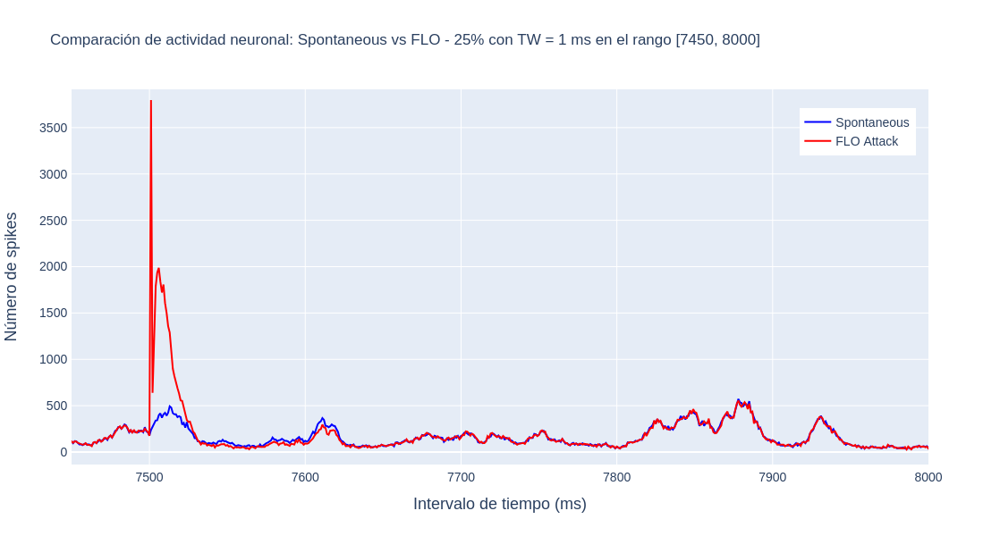

In [32]:
# Crear figura
fig = go.Figure()

# Añadir serie 'time_series' (azul)
fig.add_trace(go.Scatter(
    x=time_series_spont['interval'],
    y=time_series_spont['spikes'],
    mode='lines',
    name='Spontaneous',
    line=dict(color='blue')
))

# Añadir serie 'time_series_FLO' (rojo)
fig.add_trace(go.Scatter(
    x=time_series_FLO['interval'],
    y=time_series_FLO['spikes'],
    mode='lines',
    name='FLO Attack',
    line=dict(color='red')
))

# Actualizar diseño
fig.update_layout(
    width=1100,
    height=600,
    title=f'Comparación de actividad neuronal: Spontaneous vs FLO - 25% con TW = {TW} ms en el rango [7450, 8000]',

        xaxis=dict(
        title='Intervalo de tiempo (ms)',
        range=[7450, 8000],
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),
    yaxis=dict(
        title='Número de spikes',
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),

    legend=dict(
        x=0.85,
        y=0.95,
        font=dict(size=14)
    )
)

# Mostrar gráfico
fig.show()

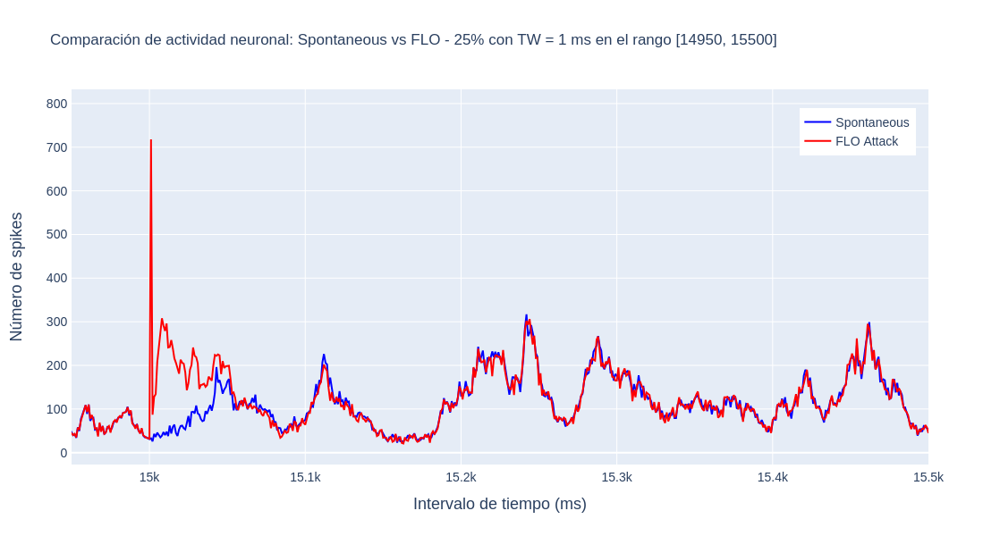

In [34]:
# Crear figura
fig = go.Figure()

# Añadir serie 'time_series' (azul)
fig.add_trace(go.Scatter(
    x=time_series_spont['interval'],
    y=time_series_spont['spikes'],
    mode='lines',
    name='Spontaneous',
    line=dict(color='blue')
))

# Añadir serie 'time_series_FLO' (rojo)
fig.add_trace(go.Scatter(
    x=time_series_FLO['interval'],
    y=time_series_FLO['spikes'],
    mode='lines',
    name='FLO Attack',
    line=dict(color='red')
))

# Actualizar diseño
fig.update_layout(
    width=1100,
    height=600,
    title=f'Comparación de actividad neuronal: Spontaneous vs FLO - 25% con TW = {TW} ms en el rango [14950, 15500]',

    xaxis=dict(
        title='Intervalo de tiempo (ms)',
        range=[14950, 15500],
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),
    yaxis=dict(
        title='Número de spikes',
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),

    legend=dict(
        x=0.85,
        y=0.95,
        font=dict(size=14)
    )
)

# Mostrar gráfico
fig.show()

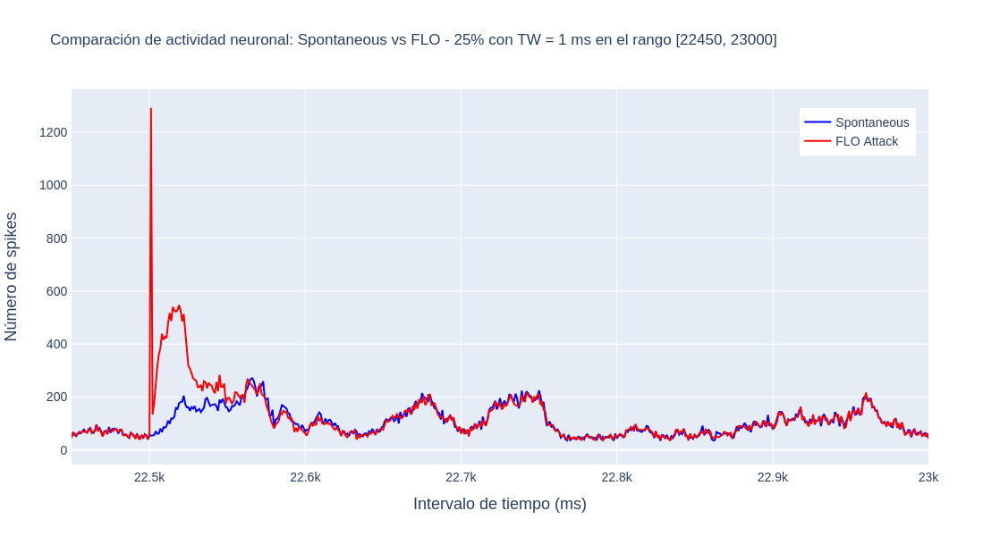

In [38]:
# Crear figura
fig = go.Figure()

# Añadir serie 'time_series' (azul)
fig.add_trace(go.Scatter(
    x=time_series_spont['interval'],
    y=time_series_spont['spikes'],
    mode='lines',
    name='Spontaneous',
    line=dict(color='blue')
))

# Añadir serie 'time_series_FLO' (rojo)
fig.add_trace(go.Scatter(
    x=time_series_FLO['interval'],
    y=time_series_FLO['spikes'],
    mode='lines',
    name='FLO Attack',
    line=dict(color='red')
))

# Actualizar diseño
fig.update_layout(
    width=1100,
    height=600,
    title=f'Comparación de actividad neuronal: Spontaneous vs FLO - 25% con TW = {TW} ms en el rango [22450, 23000]',

    xaxis=dict(
        title='Intervalo de tiempo (ms)',
        range=[22450, 23000],
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),
    yaxis=dict(
        title='Número de spikes',
        title_font=dict(size=18),
        tickfont=dict(size=14),
        showline=True,
        linewidth=2
    ),

    legend=dict(
        x=0.85,
        y=0.95,
        font=dict(size=14)
    )
)

# Mostrar gráfico
fig.show()